In [1]:
import torch
import torchvision
from torchvision.transforms import transforms as transforms

import cv2
from PIL import Image
import numpy as np
import random
import glob
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
# Label Names
coco_names = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]

print(len(coco_names))

91


In [3]:
# this will help us create a different color for each class
COLORS = np.random.uniform(0, 255, size=(len(coco_names), 3))

In [4]:
def get_outputs(image, model, threshold):

    with torch.no_grad():
        # forward pass of the image through the model
        outputs = model(image)

    # get all the scores
    scores = list(outputs[0]['scores'].detach().cpu().numpy())
    # index of those scores which are above a certain threshold
    thresholded_preds_indices = [scores.index(i) for i in scores if i > threshold]
    thresholded_preds_count = len(thresholded_preds_indices)
    # get the masks
    masks = (outputs[0]['masks']>0.5).squeeze().detach().cpu().numpy()
    # discard masks for objects which are below threshold
    masks = masks[:thresholded_preds_count]

    # get the bounding boxes, in (x1, y1), (x2, y2) format
    boxes = [[(int(i[0]), int(i[1])), (int(i[2]), int(i[3]))] for i in outputs[0]['boxes'].detach().cpu()]
    # discard bounding boxes below threshold value
    boxes = boxes[:thresholded_preds_count]
    
    # get the classes labels
    labels = [coco_names[i] for i in outputs[0]['labels']]
    return masks, boxes, labels



def draw_segmentation_map(image, masks, boxes, labels):
    
    alpha = 1
    beta = 0.6 # transparency for the segmentation map
    gamma = 0 # scalar added to each sum
    for i in range(len(masks)):
        red_map = np.zeros_like(masks[i]).astype(np.uint8)
        green_map = np.zeros_like(masks[i]).astype(np.uint8)
        blue_map = np.zeros_like(masks[i]).astype(np.uint8)
        
        # apply random color mask to each object
        color = COLORS[random.randrange(0, len(COLORS))]
        red_map[masks[i] == 1], green_map[masks[i] == 1], blue_map[masks[i] == 1] = color
        # combine all the masks into a single image
        segmentation_map = np.stack([red_map, green_map, blue_map], axis=2)
        # convert the original PIL image into NumPy format
        image = np.array(image)
        # convert from RGB to OpenCV BGR format
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
        # apply mask on the image
        cv2.addWeighted(image, alpha, segmentation_map, beta, gamma, image)

        # draw the bounding boxes around the objects
        cv2.rectangle(image, boxes[i][0], boxes[i][1], color=color, thickness=2)
        # put the label text above the objects
        cv2.putText(image, labels[i], (boxes[i][0][0], boxes[i][0][1]-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, color, thickness=2, lineType=cv2.LINE_AA)


    return image

In [5]:
def segmented_output(image_path):

    # initialize the model
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True, progress=True, num_classes=91)
    # set the computation device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    # load the model on to the computation device and set to eval mode
    model.to(device).eval()


    # transform to convert the image to tensor
    transform = transforms.Compose([transforms.ToTensor()])

    image = Image.open(image_path).convert('RGB')
    # keep a copy of the original image for OpenCV functions and applying masks
    orig_image = image.copy()


    # transform the image
    image = transform(image)
    # add a batch dimension
    image = image.unsqueeze(0).to(device)

    masks, boxes, labels = get_outputs(image, model, threshold=0.65)

    result = draw_segmentation_map(orig_image, masks, boxes, labels)
#     cv2.imshow('Segmented image', result)
#     cv2.waitKey(0)
    fig = plt.figure(figsize=(20, 20))
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    plt.axis('off')

C:\Users\shahr\anaconda3\envs\torch1.10\lib\site-packages\torch\functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ..\aten\src\ATen\native\TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


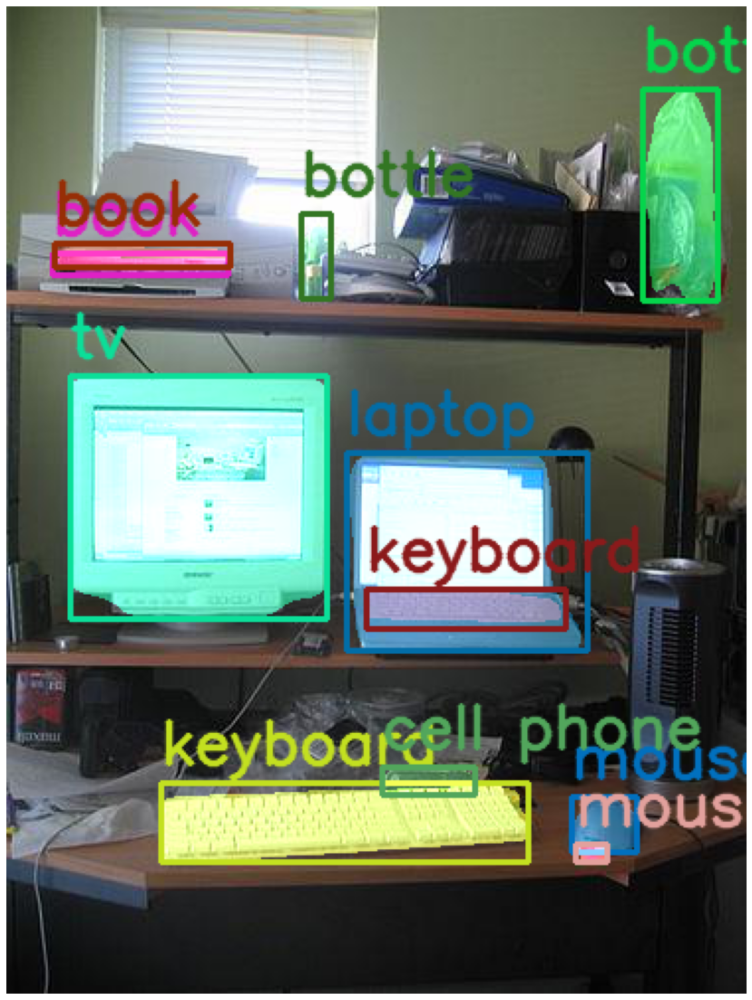

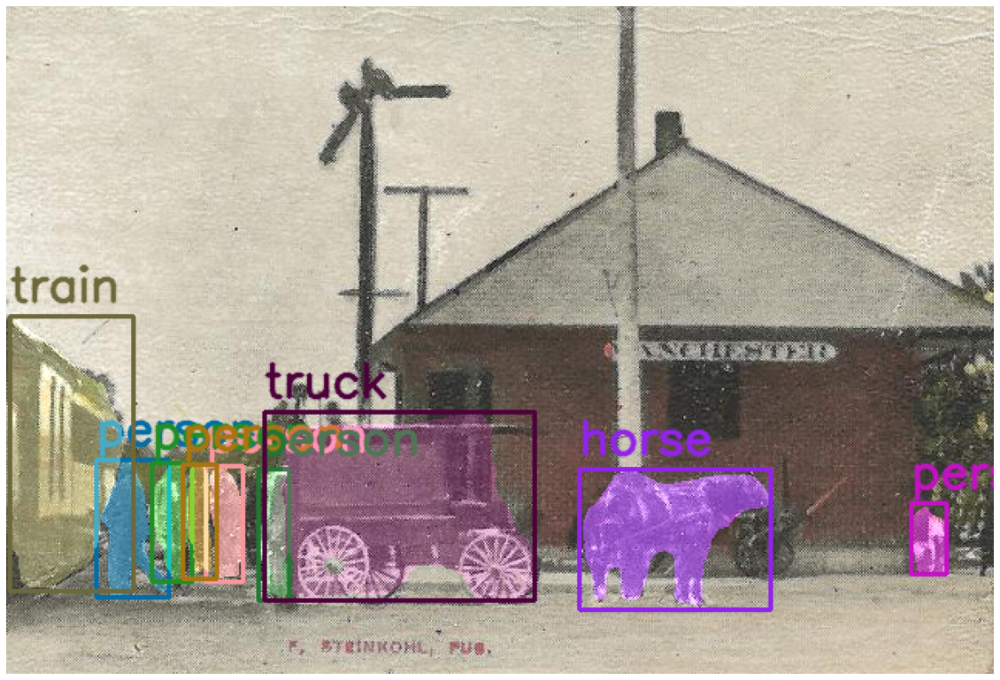

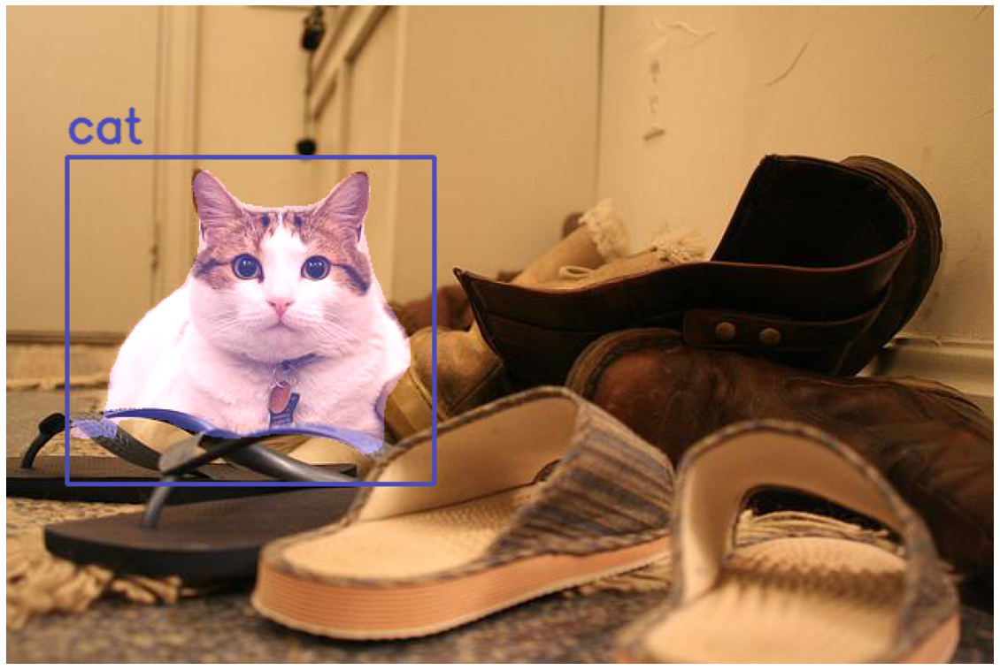

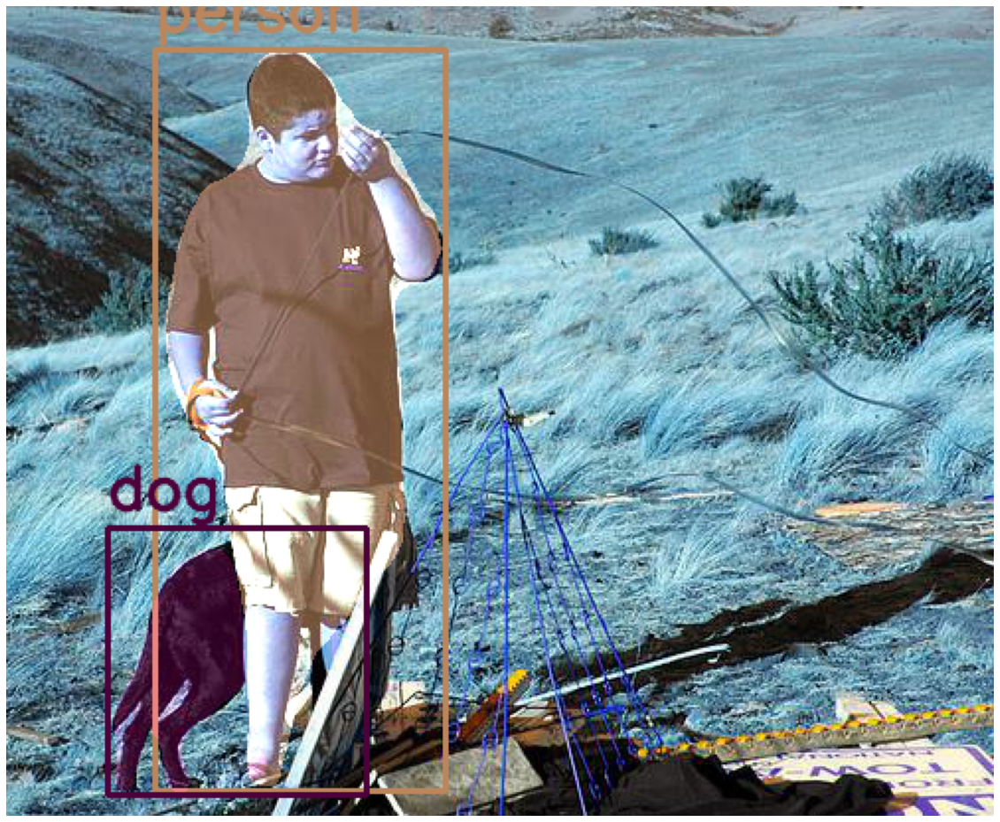

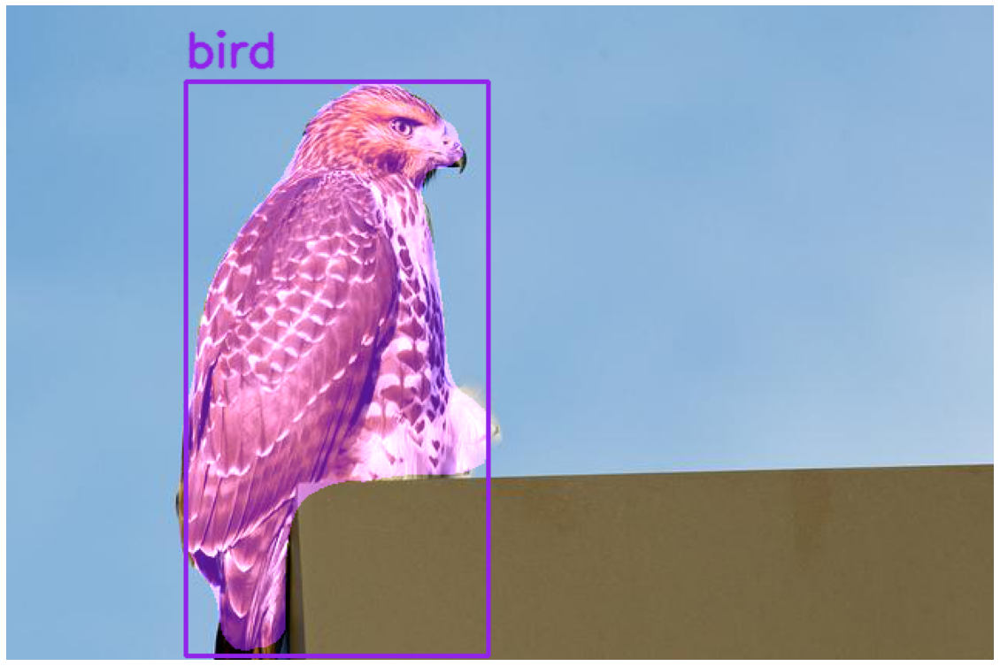

...

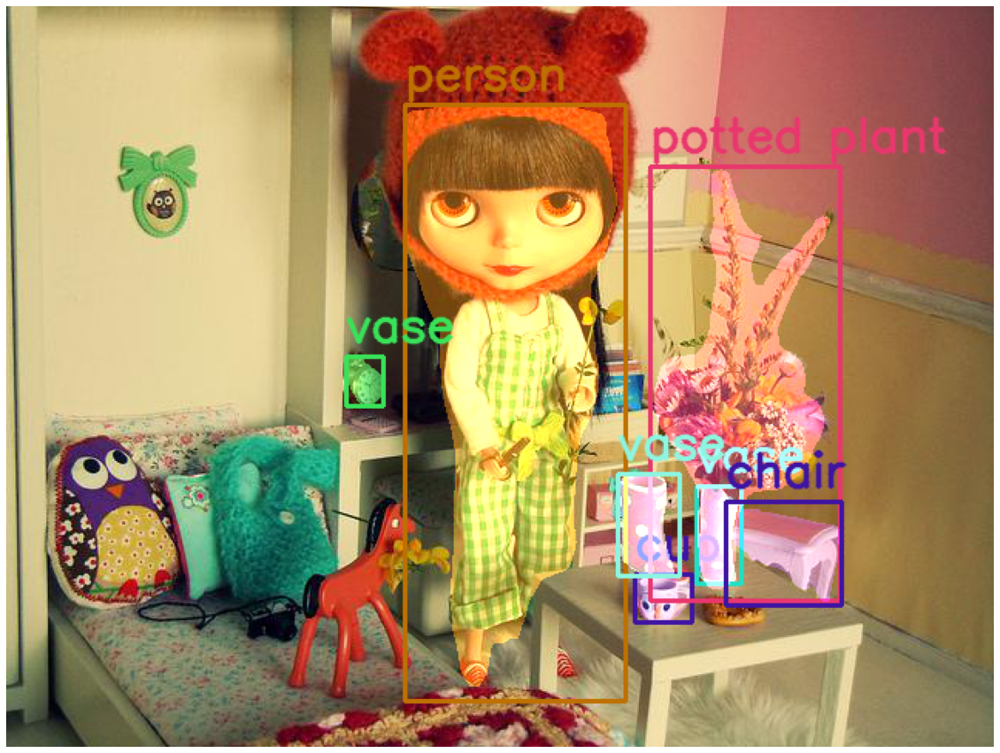

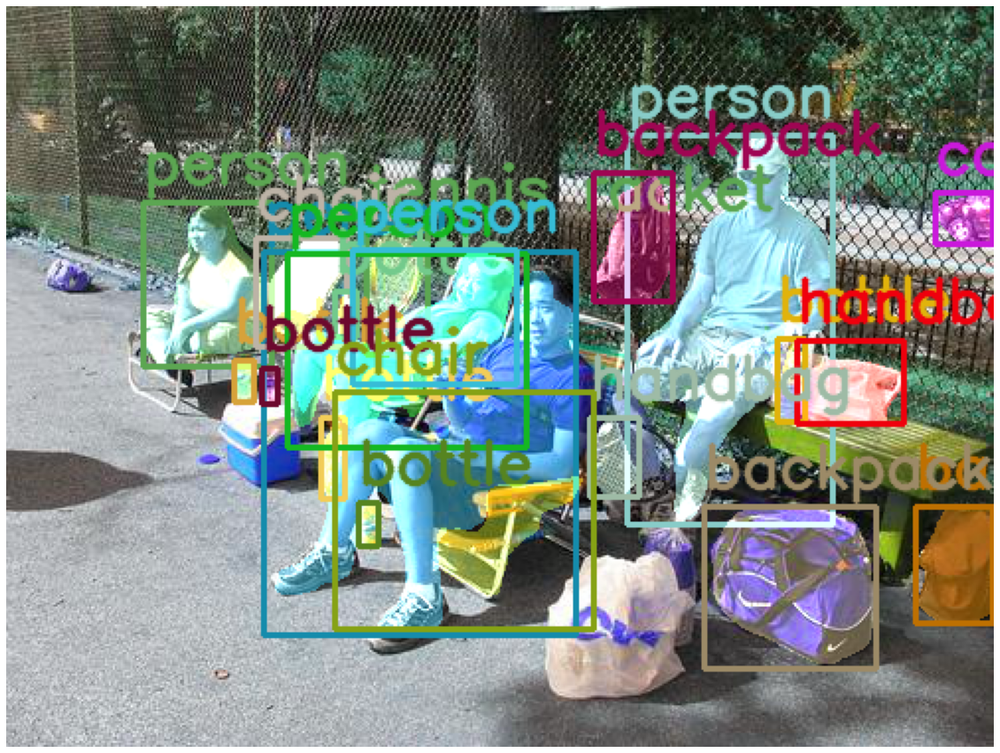

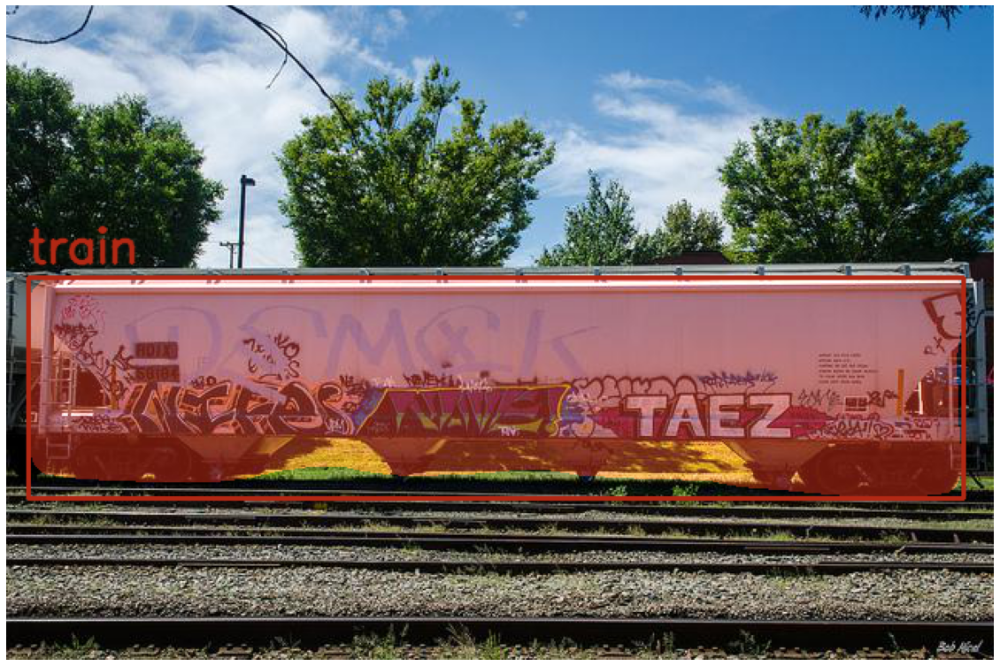

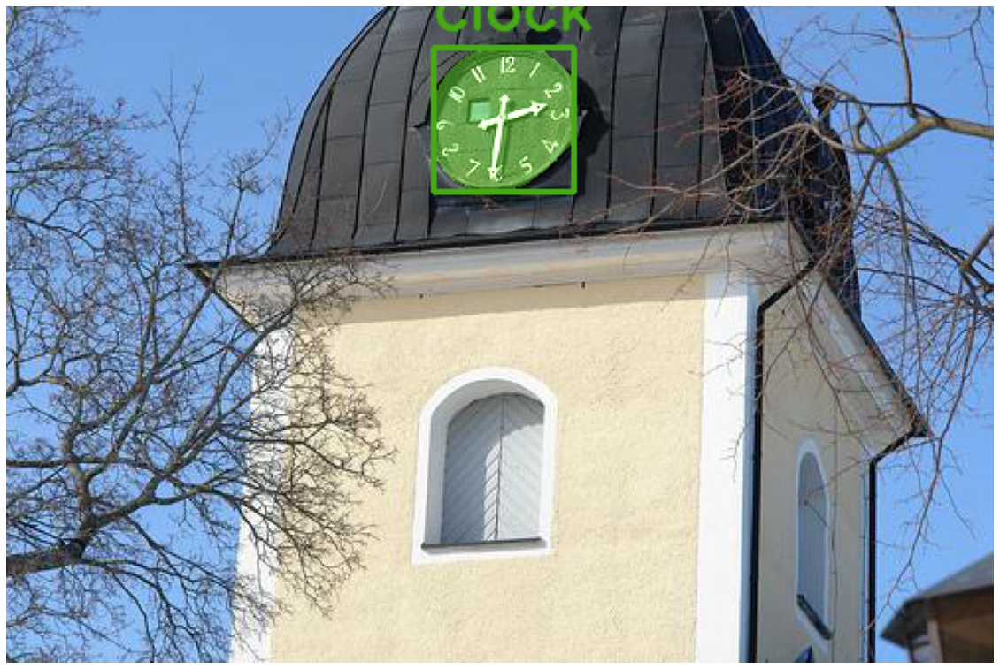

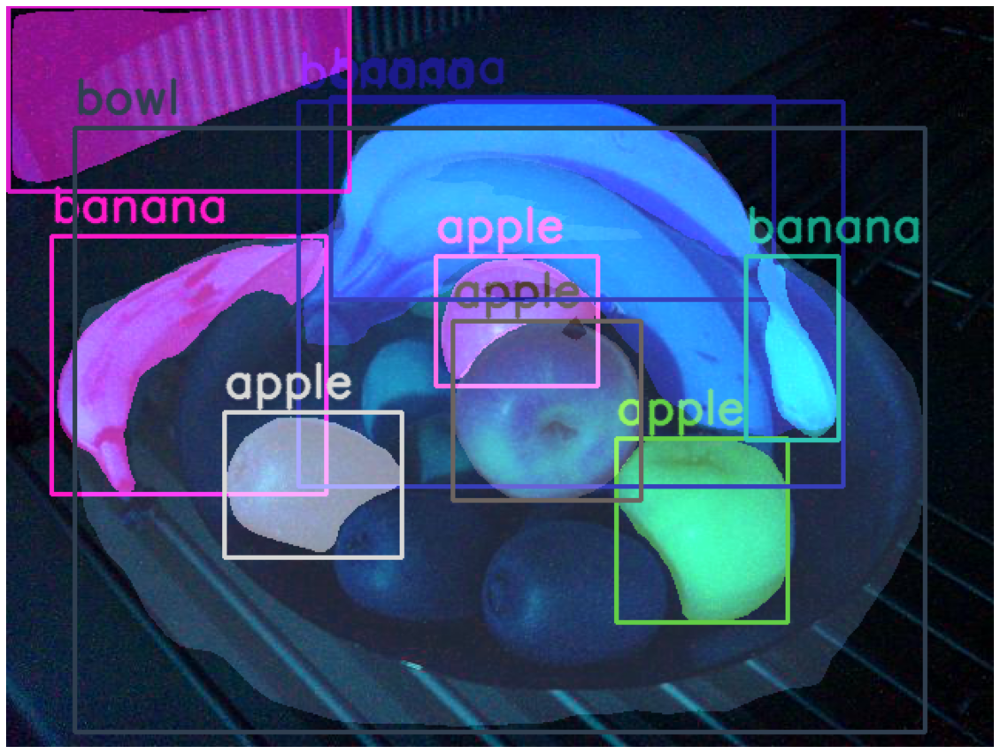

In [6]:
for img in glob.glob('../../train/image(20)/*.jpg'):
    segmented_output(img)